# Phase 1 - Ingestion and Cleaning

In the Phase 2 of the Case Study, we will carry out the following steps:
  - Ingest raw downloaded data
  - Output a combined dataset ready for analysis and modeling

In [2]:
import pandas as pd
import os
from sys import platform
import matplotlib.pyplot as plt
import datetime
import numpy as np
import pickle
import seaborn
import glob

In [2]:
# A helper function that you'll be using while reading the raw files
def is_integer(x):
    '''
    This function returns True if x is an integer, and False otherwise
    '''
    try:
        return (int(x) == float(x))
    except:
        return False

## Parameters

In [3]:
# Define the directories that contain the files downloaded
dir_cs = '/Users/apple/Desktop/Study/MLP/CS/Data/1805_download' # path to the directory where all the *.csv.zip files are located

# Define the output path for the pickle
pickle_file = dir_cs + "clean_data.pickle" # path to save cleaned data

In [4]:
# Identify the columns we'll be keeping from the dataset
cols_to_pick = ['id', 'loan_amnt', 'funded_amnt', 'term', 'int_rate', 'emp_length', 'installment', 'grade', 'home_ownership', 'annual_inc', 'verification_status', 'issue_d', 
                'loan_status', 'purpose', 'dti', 'delinq_2yrs', 'earliest_cr_line', 'open_acc', 'pub_rec',
'fico_range_high', 'fico_range_low', 'revol_bal', 'revol_util', 'total_pymnt', 'last_pymnt_d', 'recoveries'] # list of features to use for this study as indicated in the handout

# Identify the type of each of these column based on your CS-Phase 1 response
float_cols = ['loan_amnt', 'funded_amnt', 'installment','annual_inc','dti','delinq_2yrs','open_acc','pub_rec','fico_range_high', 'fico_range_low', 'revol_bal', 'total_pymnt', 'recoveries']
cat_cols = ['grade','home_ownership','verification_status','loan_status', 'purpose', 'term','emp_length'] # categorical features
perc_cols = ['int_rate', 'revol_util']
date_cols = ['issue_d', 'earliest_cr_line', 'last_pymnt_d']

# Ensure that we have types for every column
assert set(cols_to_pick) - set(float_cols) - set(cat_cols) - set(perc_cols) - set(date_cols) == set(["id"])

In [5]:
# Some of the columns selected will not be used directly in the model,
# but will be used to generate other features.
#
# Create variables specifying the features that will be used

# All categorical columns other than "loan_status" will be used as
# discrete features

discrete_features = list(set(cat_cols) - set(["loan_status"]))

# All numeric columns will be used as continuous features
continuous_features = list(float_cols + perc_cols)

## Ingestion
Ingest the data files from both sets, perform consistency checks, and prepare one single file for each set

In [6]:
def ingest_files(directory):
    '''
    This function will ingest every file in the specified directory
    into a pandas dataframe. It will return a dictionary containing
    these dataframes, keyed by the file name.
    
    We assume the directory contains files directly downloaded from
    the link given in the handout, and *only* those files. Thus, we 
    assume the files are zipped (pd.read_csv can read zipped files) 
    and we assume the first line in each file needs to be skipped.
    
    Note that each file will be read *without* formatting
    '''
    
    # If the directory has no trailing slash, add one
    if directory[-1] != "/":
        directory=directory + '/'
    
    all_files = glob.glob(directory +'*.csv.zip') # get list of all files from the directory
    output = {}
    
    print("Directory " + directory + " has " + str(len(all_files)) + " files:")
    for i in all_files:
        print("    Reading file " + i)
        output[i] = pd.read_csv(i, dtype='str', skiprows=1) # read each with dtype='str' and skip_rows =1
        
        # Some of the files have "summary" lines that, for example
        # read "Total number of loans number in Policy 1: ....."
        # To remove those lines, find any lines with non-integer IDs
        # and remove them
        
        #we created another variable to get the valid rows to index later, since this is easier
        invalid_rows = np.hstack([not is_integer(val) for val in output[i]["id"]])# mask rows that have non-integer IDs. Use is_integer method
        valid_rows = np.hstack([is_integer(val) for val in output[i]["id"]])
        
        #Remove invalid rows
        if invalid_rows.sum() > 0: 
            print("Found " + str(sum(invalid_rows)) + " invalid rows which were removed")
            output[i] = output[i][valid_rows] # remove invalid rows
    
        print(output[i].shape)
    return output # return dictionary of dataframe

In [7]:
# Ingest the set of files we downloaded using the defined method "ingest_files"
files_cs = ingest_files(dir_cs) # dictionary of (filename, dataframe) as (key, value)

Directory /Users/apple/Desktop/Study/MLP/CS/Data/1805_download/ has 12 files:
    Reading file /Users/apple/Desktop/Study/MLP/CS/Data/1805_download/LoanStats_securev1_2016Q3.csv.zip
Found 2 invalid rows which were removed
(99120, 151)
    Reading file /Users/apple/Desktop/Study/MLP/CS/Data/1805_download/LoanStats_securev1_2016Q2.csv.zip
Found 2 invalid rows which were removed
(97854, 151)
    Reading file /Users/apple/Desktop/Study/MLP/CS/Data/1805_download/LoanStats3a_securev1.csv.zip
Found 3 invalid rows which were removed
(42535, 151)
    Reading file /Users/apple/Desktop/Study/MLP/CS/Data/1805_download/LoanStats_securev1_2017Q1.csv.zip
Found 2 invalid rows which were removed
(96779, 151)
    Reading file /Users/apple/Desktop/Study/MLP/CS/Data/1805_download/LoanStats3d_securev1.csv.zip
Found 2 invalid rows which were removed
(421095, 151)
    Reading file /Users/apple/Desktop/Study/MLP/CS/Data/1805_download/LoanStats_securev1_2017Q3.csv.zip
Found 2 invalid rows which were removed
(1

### Combine the files

In [8]:
data_cs = (pd.concat(files_cs)).reset_index(drop=True) # combine "files_cs" into a pandas dataframe
              # reset index with drop = True
data_cs.shape

(1765426, 151)

## Prepare Final Dataset

In [9]:
# Keep only the columns of interest from 'data_cs'
final_data = data_cs[cols_to_pick]
final_data.shape

(1765426, 26)

In [10]:
print("Starting with " + str(len(final_data)) + " rows")

Starting with 1765426 rows


### Typecast the columns

In [11]:
# Remember that we read the data as string (without any formatting). 
# Now we would typecast the columns based on feature types which you found out in CS Phase 1


#ask about warning.
for i in float_cols:
    final_data[i] = final_data[i].astype(float) # typecast float columns

/Users/apple/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  import sys


In [12]:
def clean_perc(x):
    if pd.isnull(x):
        return np.nan
    else:
        return float(x.strip()[:-1])

#Apply cleaning function to percentage columns
for i in perc_cols:
    final_data[i] = final_data[i].apply(clean_perc)

/Users/apple/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


In [13]:
def clean_date(x):
    if pd.isnull(x):
        return None
    else:
        return datetime.datetime.strptime( x, "%b-%Y").date()

    
#Apply cleaning function to date columns
for i in date_cols:
    final_data[i] = final_data[i].apply(clean_date)

/Users/apple/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  # Remove the CWD from sys.path while we load stuff.


In [14]:
def clean_cat(x):
    if pd.isnull(x) or len(x) < 1:
        return None
    else:
        return str(x)
    
#Apply cleaning function to category columns
for i in cat_cols:
    # for categorical features if the value is null/empty set it to None
    final_data[i] = final_data[i].apply(clean_cat)
    

/Users/apple/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  # Remove the CWD from sys.path while we load stuff.


## Calculate returns for each loan

In [15]:
# Define the names of the four returns we'll be calculating as described in Q.6
# ret_PESS: Pessimistic return
# ret_OPT: Optimistic return
# ret_INTa, ret_INTb: Method3 at two differnt values of "i"
ret_cols = ["ret_PESS", "ret_OPT", "ret_INTa", "ret_INTb"]

In [16]:
# Remove all rows for loans that were paid back on the days they were issued

#debug and make sure it worked
final_data['loan_length'] = (final_data.last_pymnt_d - final_data.issue_d) / np.timedelta64(1, 'M')
n_rows = len(final_data)

loan_length_nonzero = final_data['loan_length'] != 0
final_data = final_data[loan_length_nonzero] # select rows where loan_length is not 0. 

print("Removed " + str(n_rows - len(final_data)) + " rows")

/Users/apple/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  after removing the cwd from sys.path.


Removed 6218 rows


### M1-Pessimistic Method

In [17]:
# Calculate the return using a simple annualized profit margin
# Pessimistic definition (Handout 6a.) (M1)

final_data['term_num'] = final_data.term.str.extract('(\d+)',expand=False).astype(int) # length of loan in months

final_data['ret_PESS'] = (final_data['total_pymnt']-final_data['funded_amnt'])*12/(final_data['funded_amnt']*final_data['term_num'])

### M2-Optimistic Method

In [18]:
# Assuming that if a loan gives a positive return, we can
# immediately find a similar loan to invest in; if the loan
# takes a loss, we use M1-pessimistic to compute the return

final_data['ret_OPT'] = (final_data['total_pymnt']-final_data['funded_amnt'])*12/(final_data['funded_amnt']*final_data['loan_length'])

final_data.loc[final_data.ret_OPT <= 0,'ret_OPT'] = final_data['ret_PESS']

### Method 3

In [19]:
def ret_method_3(T, i):
    '''
    Given an investment time horizon (in months) and re-investment
    interest rate, calculate the return of each loan
    '''
    
    # Assuming that the total amount paid back was paid at equal
    # intervals during the duration of the loan, calculate the
    # size of each of these installment
    actual_installment = (final_data.total_pymnt - final_data.recoveries) / final_data.loan_length
#     print(actual_installment)
    # Assuming the amount is immediately re-invested at the prime
    # rate, find the total amount of money we'll have by the end
    # of the loan
    cash_by_end_of_loan = actual_installment * ((1-(1+i)**final_data.loan_length)/(1-(1+i))) # compute the quantity given in [] in eq.2.3 of handout
    
    cash_by_end_of_loan = cash_by_end_of_loan + final_data.recoveries
#     print(cash_by_end_of_loan)
    # Assuming that cash is then re-invested at the prime rate,
    # with monthly re-investment, until T months from the start
    # of the loan
    remaining_months = T - final_data['loan_length']
    
    final_return = (cash_by_end_of_loan * ((1+i)**remaining_months)-final_data.funded_amnt)*(1/final_data.funded_amnt) 
    
    # Find the percentage return
    ret_val = (12/T) * final_return
    return ret_val

In [20]:
final_data['ret_INTa'] = ret_method_3(T=60,i=0.002) # call ret_method_3 with T=60, i=0.002
final_data['ret_INTb'] = ret_method_3(T=60,i=0.005) # call ret_method_3 with T=60, i=0.005


### Visualize the variables

In [21]:
def visualize_float_columns():
    '''
    This function visualizes Box-and-whisker plots for continuous variables
    '''
    
    # FLoat columns
    for i in float_cols + perc_cols + ret_cols:
        seaborn.boxplot(final_data[i])

        # Print the three highest values - we used unique call to ensure we displayed 3 uniquely high values
        highest_vals = np.unique(np.array(final_data[i].sort_values(ascending=True))) # get 3 highest values
        smallest_val = min(final_data[i])
        plt.text(smallest_val, -0.3, highest_vals[-1])
        plt.text(smallest_val, -0.2, highest_vals[-2])
        plt.text(smallest_val, -0.1, highest_vals[-3])

        plt.show()

In [22]:
def visualize_cat_columns():
    '''
    Lists the distinct values for categorical columns
    '''
    # Categorical columns 
    for i in cat_cols:
        print(i) # print field name
        print(len(set(final_data[i]))," values") # print number of distinct values
        set_data=set(final_data[i])
        for val in set_data:
            # for each distinct value print the number of occurences
            print(val,": ",len(final_data[i][final_data[i]==val]))
        print("")
        print("")
        

In [23]:
def visualize_date_columns():
    '''
    This function visualizes a timeline density for dates
    '''
    
    # Date columns
    for i in date_cols:
        final_data[final_data[i].isnull() == False][i].apply(lambda x : str(x.year) +
                                                "-" + str(x.month)).value_counts(ascending = True).plot()
        plt.title(i + " (" + str(final_data[i].isnull().sum()) + " null values)")
        plt.show()

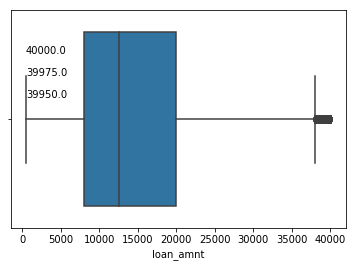

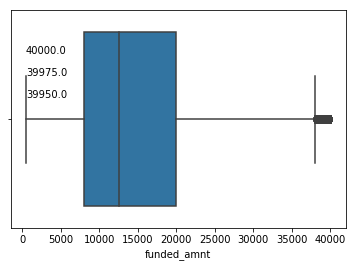

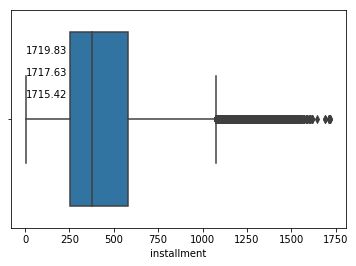

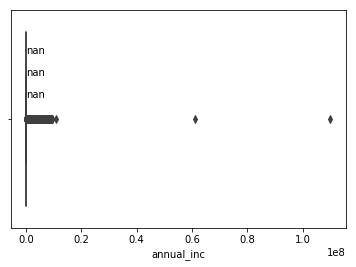

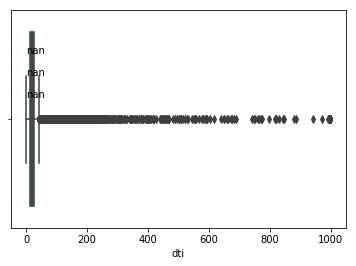

...

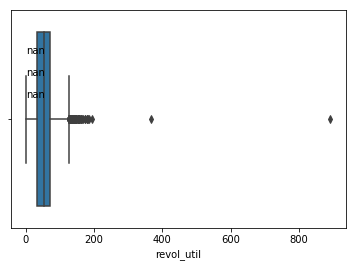

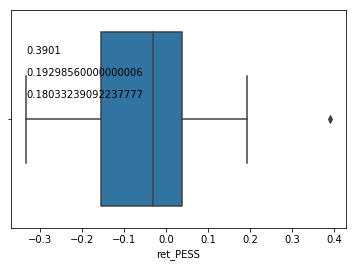

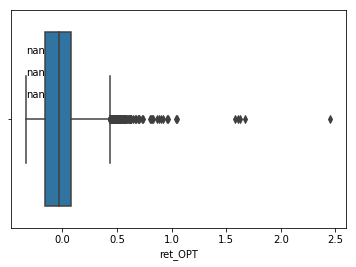

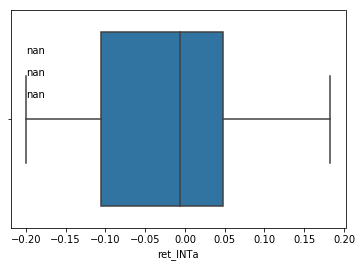

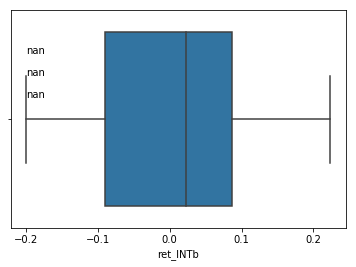

grade
7  values
D :  254390
C :  521315
F :  38424
G :  11382
E :  116174
A :  296996
B :  520527


home_ownership
6  values
MORTGAGE :  869367
OWN :  191886
NONE :  54
RENT :  697215
ANY :  504
OTHER :  182


verification_status
3  values
Verified :  529097
Not Verified :  561817
Source Verified :  668294


loan_status
9  values
Fully Paid :  736866
Late (16-30 days) :  5758
Does not meet the credit policy. Status:Charged Off :  761
Current :  792304
Does not meet the credit policy. Status:Fully Paid :  1988
Late (31-120 days) :  20447
Default :  392
Charged Off :  191939
In Grace Period :  8753


purpose
14  values
wedding :  2350
renewable_energy :  1164
major_purchase :  38532
house :  8579
vacation :  11960
educational :  424
medical :  20738
home_improvement :  117204
moving :  12215
debt_consolidation :  1015187
credit_card :  388215
small_business :  20038
other :  103755
car :  18847


term
2  values
 36 months :  1260610
 60 months :  498598


emp_length
12  values
None :  0


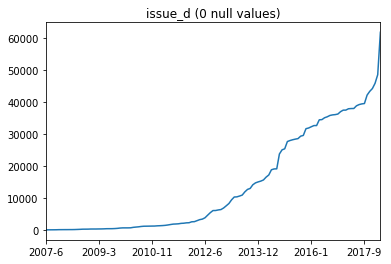

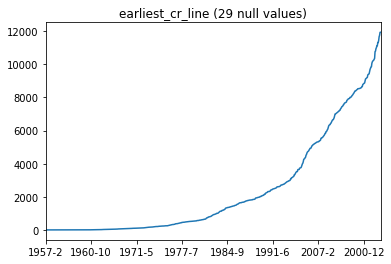

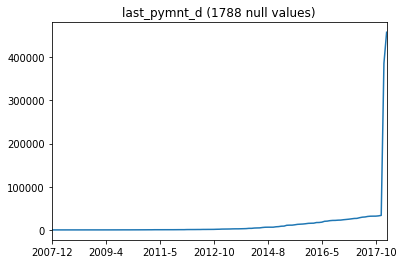

In [24]:
# visualize continuous features
visualize_float_columns()

# visulaize categorical features
visualize_cat_columns()

# visualize date columns
visualize_date_columns()

### Handle outliers

__Reasons for selecting feature to remove outliers__<br>
1) We immediately identified massive outliers in the 'annual_inc' variable from our boxplot. The median value of that column was ~77,000, but we had multiple observations that had 'annual_inc' which were much larger than that. For example we had one borrower who had annual incomes of \\$61 million dollars, which is nearly 800x more than the median income of our data. We decided to drop observations with 'annual_inc' greater than \\$1 million dollars, since it removed a bunch of outliers from our data without removing some more realistic incomes we might see borrower's have in future unseen data, thus allowing our model to have some ability to generalize to unseen data. <br><br>
2) The next feature we identified as requiring outliers to be removed was the 'open_acc' feature which stores the number of currently open banking/financial accounts for a borrower. We saw a large "tail" of outliers that went up to ~80 open accounts. We settled on removing all observations that had values larger than 55 open accounts. This was again due to us analyzing and weighing the benfits vs drawbacks of removing too many or too few features. By removing 55 features we ended up not removing to large of a portion of our dataset, but we restricted our dataset to a more realistic range of values for number of open accounts a new borrower requesting a loan might have. <br><br>
3) We then noticed that the feature 'revol_bal' had a couple noticeable outlier points as well. This feature represents the total credit revolving balance for a borrower. We decided to restrict our dataset to observations with a 'revol_bal' value less than 1 million. By removing these observations, our new boxplot (shown below) looks much better distributed and no longer has extreme outlier values. <br><br>
4) Finally, we found the feature 'revol_util' had a outliers points as well. This feature represents the revolving line utilization rate or amount of credit the borrower is using relative to all available revolving credit. We decided to restrict our dataset to observations with a 'revol_util' value less than 200. By removing these observations, our new boxplot (shown below) looks much better distributed and no longer has major outlier values.

In [25]:
# There are quite a few outliers. 
# Please identify top-k (decide this based on the visualization) features where outliers are most obvious
n_rows = len(final_data)

#For each of the 4 features that we identified as having outliers, we made a mask of those outliers and than
#negated that mask (e.g. ~annual_inc) to ensure we only kept the non-outlier observations
annual_inc = (final_data['annual_inc'] >= 1000000)
final_data = final_data[~annual_inc] # remove outliers based 1st obvious feature
open_accounts = (final_data['open_acc'] >= 55)
final_data = final_data[~open_accounts] # remove outliers based 2nd obvious feature
revolving_balance = (final_data['revol_bal'] >= 1000000)
final_data = final_data[~revolving_balance] #remove outliers based on 3rd obvious feature
revolving_util = (final_data['revol_util'] > 200)
final_data = final_data[~revolving_util]

print(n_rows, len(final_data))
print("Removed " + str(n_rows - len(final_data)) + " rows")

1759208 1758607
Removed 601 rows


In [26]:
# Remove all loans that are still current
n_rows = len(final_data)

#We only looked to keep the 3 core "non-current" loan statuses in our data that were mentioned in the PDF. We made sure
#to drop all other loans that did not have these statuses from our data.
not_current = ((final_data['loan_status'] == 'Fully Paid') | (final_data['loan_status'] == 'Charged Off')|(final_data['loan_status'] == 'Default'))


final_data = final_data[not_current]

print("Removed " + str(n_rows - len(final_data)) + " rows")

Removed 829687 rows


In [27]:
# Only include loans isssued since 2010
n_rows = len(final_data)
after_jan_2010 = (final_data['issue_d'] >= datetime.datetime.strptime("1/1/2010", "%m/%d/%Y").date())

final_data = final_data[after_jan_2010]

print("Removed " + str(n_rows - len(final_data)) + " rows")

Removed 6525 rows


### Drop null values

In [28]:
# Deal with null values. We allow cateogrical variables to be null
# OTHER than grade, which is a particularly important categorical.
# All non-categorical variables must be non-null, and we drop
# rows that do not meet this requirement

required_cols = set(cols_to_pick) - set(cat_cols) - set(["id"])
required_cols.add("grade")

n_rows = len(final_data)

# drop rows that contain null based only on "required_cols"
final_data = final_data.dropna(subset=list(required_cols))

print("Removed " + str(n_rows - len(final_data)) + " rows")

Removed 2287 rows


### Visualize clean data

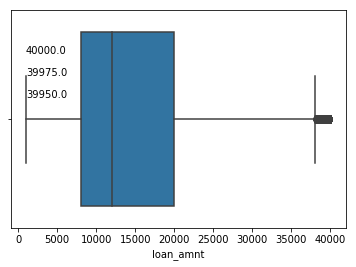

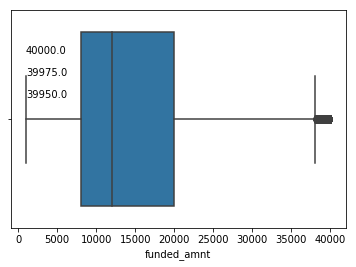

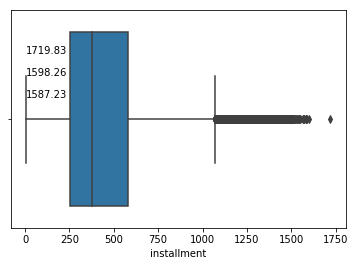

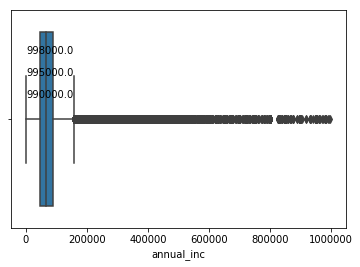

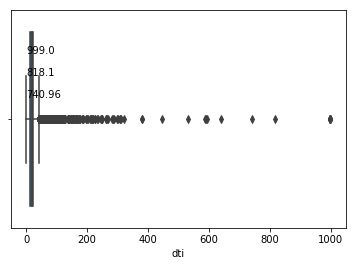

...

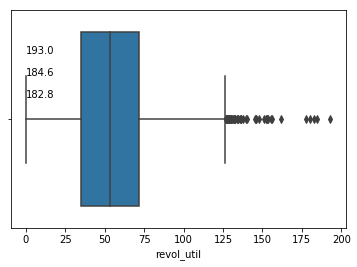

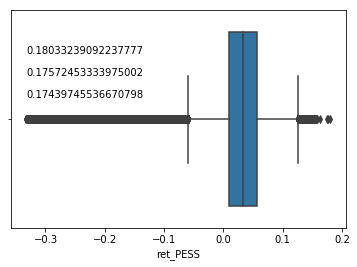

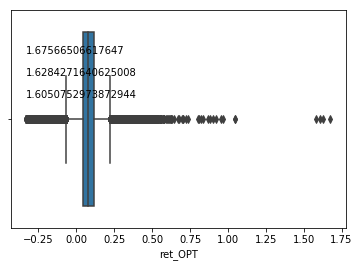

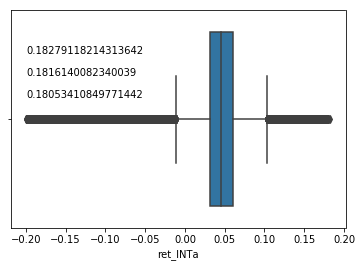

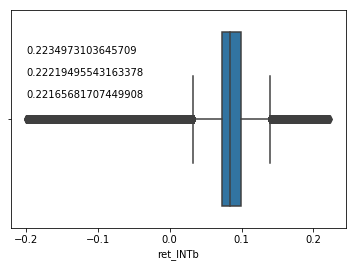

grade
7  values
D :  142087
C :  257521
F :  25045
G :  6660
E :  69920
A :  153197
B :  265678


home_ownership
6  values
MORTGAGE :  458968
OWN :  94315
NONE :  44
RENT :  366611
ANY :  121
OTHER :  49


verification_status
3  values
Verified :  300536
Not Verified :  280979
Source Verified :  338593


loan_status
3  values
Fully Paid :  730510
Default :  390
Charged Off :  189208


purpose
14  values
wedding :  2085
renewable_energy :  648
major_purchase :  19354
house :  4466
vacation :  5864
educational :  100
medical :  9843
home_improvement :  57592
moving :  6403
debt_consolidation :  544146
credit_card :  199735
small_business :  10778
other :  49346
car :  9748


term
2  values
 36 months :  697454
 60 months :  222654


emp_length
12  values
None :  0
7 years :  43511
8 years :  43533
9 years :  35823
1 year :  59964
10+ years :  300842
2 years :  83171
6 years :  44885
3 years :  73354
< 1 year :  72511
4 years :  55011
5 years :  58451




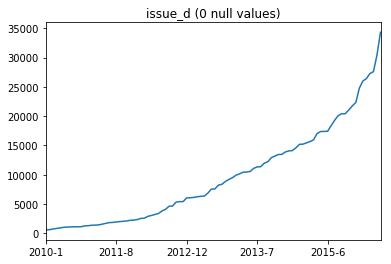

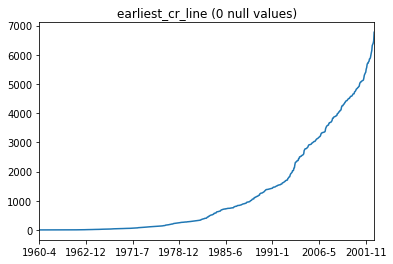

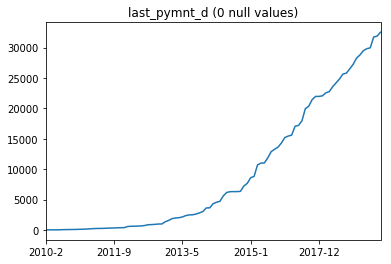

In [29]:
# Visualize the data again after cleaning
visualize_float_columns()
visualize_cat_columns()
visualize_date_columns()

In [30]:
x_vars= ['loan_amnt', 'funded_amnt', 'term', 'int_rate', 'emp_length',
       'installment', 'grade', 'home_ownership', 'annual_inc',
       'verification_status', 'issue_d', 'loan_status', 'purpose', 'dti',
       'delinq_2yrs', 'earliest_cr_line', 'open_acc', 'pub_rec',
       'fico_range_high', 'fico_range_low', 'revol_bal', 'revol_util',
       'total_pymnt', 'last_pymnt_d', 'recoveries', 'loan_length', 'term_num',
       'ret_PESS', 'ret_OPT', 'ret_INTa', 'ret_INTb']

/Users/apple/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


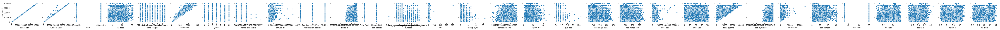

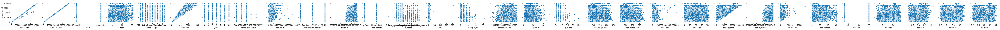

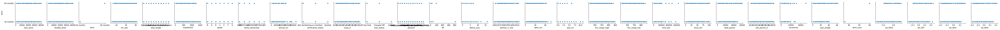

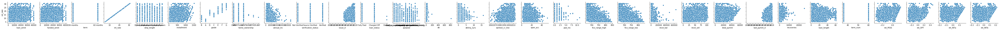

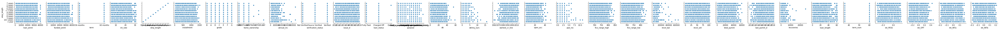

...

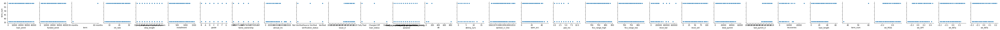

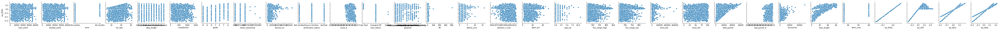

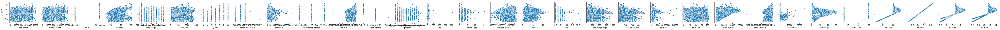

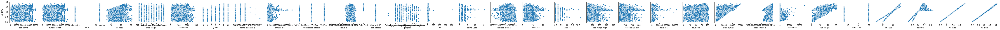

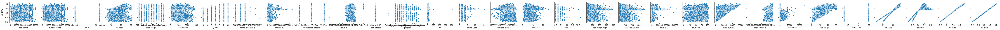

In [31]:
#Due to Seaborn's pairplot funcitons inability to handle categorical data correctly alongside numerical or date data,
#we had to split up the plotting process to plot one variable vs all other variables one at a time. Shown below
#are the plots of one variable on the y-axis vs all variables on the x-axis. Double click on the images to expand.
#them and l. Additionally, due to the massive amount of data points Seaborn was attempting to plot, we took a 
#sub-sample of our entire dataset and only plotted those points to speed up the process.

#IN ORDER TO BETTER SEE EACH PLOT, DOUBLE CLICK ON EACH IMAGE AND IT WILL EXPAND AND YOU CAN SCROLL SIDE TO SIDE
final_data_sample=final_data.sample(n=10000)
for x in x_vars:
    g = seaborn.pairplot(final_data_sample,x_vars= x_vars
                      ,y_vars=x)

/Users/apple/anaconda3/lib/python3.6/site-packages/seaborn/axisgrid.py:2065: UserWarning: The `size` parameter has been renamed to `height`; pleaes update your code.
  warnings.warn(msg, UserWarning)


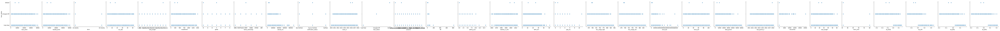

In [32]:
# Visualize relation between loan status and features
g = seaborn.pairplot(final_data_sample, x_vars=x_vars,y_vars=["loan_status"],size = 4)

What do you observe after removing the outliers?


__Answer:__ We now can observe that the features we altered by removing outliers above look more "reasonably" distributed. These features no longer have massive outlier points that stretch the box plots and distort what the "normal range" of values are for these features. Additionally, we can see that for the features we altered, their new "outliers" that exist are within a more reasonable range to the median and interquartile range for these features.

### Data Exploration
Solution to Q.7 from the handout

In [33]:
# Find the percentage of loans by grade, the default by grade,
# and the return of each grade
perc_by_grade = (final_data.grade.value_counts()*100/len(final_data)).sort_index()

default_by_grade = final_data.groupby("grade").apply(lambda x : (x.loan_status != "Fully Paid").sum()*100/len(x) )
ret_by_grade_OPT = final_data.groupby("grade")['ret_OPT'].mean() # average return for M2-Optimistic for each loan grade
ret_by_grade_PESS = final_data.groupby("grade")['ret_PESS'].mean() # average return for M1-Pessimistic for each loan grade
ret_by_grade_INTa = final_data.groupby("grade")['ret_INTa'].mean() # average return for M3
ret_by_grade_INTb = final_data.groupby("grade")['ret_INTb'].mean()# average return for M3
int_rate_by_grade = final_data.groupby("grade")['int_rate'].mean() # average interest rate for each grade

combined = pd.DataFrame(perc_by_grade)
combined.columns = ['perc_of_loans']
combined['perc_default'] = default_by_grade
combined['avg_int_rate'] = int_rate_by_grade
combined['return_OPT'] = ret_by_grade_OPT
combined['return_PESS'] = ret_by_grade_PESS
combined['return_INTa'] = ret_by_grade_INTa
combined['return_INTb'] = ret_by_grade_INTb

combined

,perc_of_loans,perc_default,avg_int_rate,return_OPT,return_PESS,return_INTa,return_INTb
A,16.649893,6.358480,7.212869,0.038859,0.016599,0.031433,0.067708
B,28.874654,13.570186,10.846919,0.050089,0.015693,0.031093,0.067449
C,27.988127,22.612136,14.075213,0.053941,0.006034,0.024586,0.060269
D,15.442426,30.648828,17.548514,0.057084,0.000345,0.019591,0.054395
E,7.599108,39.167620,20.733692,0.059505,-0.009200,0.011077,0.044557
F,2.721963,45.414254,24.467972,0.064263,-0.014420,0.005341,0.037919
G,0.723828,49.024024,27.094494,0.066671,-0.026006,-0.004569,0.027173


Based on the output of previous cell, write down your answers to Q.7 from the handout.

### Save a Pickle

In [34]:
# Remove the "total_pymnt" and "recoveries" from the list of continuous features
continuous_features.remove('total_pymnt') 
continuous_features.remove('recoveries')

Why did we remove `total_pymt` and `recoveries` from the data for the task of predicting whether to give loan or not, although these are highly predictive features?


__Answer:__ The reason we want to remove __total_pymt__ and __recoveries__ is due to the fact that these features are considered to be "future" information that we do not (and would not) know at the time of loan application. If we were to use these highly predictive features in our model, our model would identify these two features as two of the main features that should be used for prediciting the outcome of a given loan application. But once we start using our model on new, unseen observations, our model will no longer have access to the __total_pymt__ and __recoveries__ features (again since new loans won't have these values populated until after the loans get invested in), so our model will have a worse test error than we would expect based on the training and validation error we would see using the training and validation sets alongside these two "future features".

In [35]:
# save the prepared data for modeling in next Phase.
pickle.dump( [final_data, discrete_features, continuous_features, ret_cols], open(pickle_file, "wb") )

In [3]:
# Read the data and features from the pickle file saved in CS-Phase 2
data, discrete_features, continuous_features, ret_cols = pickle.load( open( "dataclean_data.pickle", "rb" ) )

FileNotFoundError: [Errno 2] No such file or directory: 'dataclean_data.pickle'